# HealthPredictor
<hr>

## Midterm Jupyter Notebook, Group 1 - Healthcare
## CIS-579-002, Introduction to Artificial Intelligence
### Avinash Shete, Chandana Bhadravati Nagaraj, Jim Small, Ritesh Revansiddappa Honnalli

### Setup environment/notebook:

In [1]:
# Needed libraries:
# Standard Library:
import math
import pickle

# 3rd Party:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display as display
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

# Suppress all warnings - remove for debugging/tuning:
# import warnings
# warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 54)

In [2]:
# Load data:
# Note:  Using forward slashes ("/" versus "\") so works on both Windows and Linux/macOS:
data = './Data/chronickidneydisease-kaggle-1659x52.csv'
df= pd.read_csv(data)

# Explore first few rows:
df.head()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
0,1,71,0,0,0,2,31.069414,1,5.128112,1.676220,0.240386,4.076434,0,0,0,0,0,113,83,72.510788,9.212397,4.962531,25.605949,45.703204,0.744980,123.849426,137.652501,3.626058,10.314420,3.152648,16.114679,207.728670,85.863656,21.967957,212.095215,0,0,4.563139,1,0,0,3.563894,6.992244,4.518513,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1,Confidential
1,2,34,0,0,1,3,29.692119,1,18.609552,8.377574,6.503233,7.652813,1,1,0,0,0,120,67,100.848875,4.604989,3.156799,31.338166,55.784504,3.052317,88.539095,138.141335,5.332871,9.604196,2.855443,15.349205,189.450727,86.378670,87.569756,255.451314,0,0,9.097002,0,0,0,5.327336,0.356290,2.202222,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1,Confidential
2,3,80,1,1,0,1,37.394822,1,11.882429,9.607401,2.104828,4.392786,0,0,0,0,0,147,106,160.989441,5.432599,3.698236,39.738169,67.559032,1.157839,21.170892,142.970116,4.330891,9.885786,4.353513,13.018834,284.137622,132.269872,20.049798,251.902583,0,1,3.851249,1,0,0,4.855420,4.674069,5.967271,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1,Confidential
3,4,40,0,2,0,1,31.329680,0,16.020165,0.408871,6.964422,6.282274,0,0,0,0,0,117,65,188.506620,4.144466,2.868468,21.980958,33.202542,3.745871,123.779699,137.106913,3.810741,9.995894,4.016134,15.056339,235.112124,93.443669,58.260291,392.338425,0,0,7.881765,0,0,0,8.531685,5.691455,2.176387,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1,Confidential
4,5,43,0,1,1,2,23.726311,0,7.944146,0.780319,3.097796,4.021639,0,0,0,0,0,98,66,82.156699,4.262979,3.964877,12.216366,56.319082,2.570993,184.852046,140.627812,4.866765,8.907622,3.947907,16.690561,258.277566,171.758356,21.583213,370.523877,1,1,4.179459,1,0,0,1.422320,2.273459,6.800993,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1,Confidential


### First look at data/dataframe:

In [3]:
# Dimensions (rows, columns) of dataframe:
df.shape

(1659, 54)

In [4]:
# Show overview of dataframe columns:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659 entries, 0 to 1658
Data columns (total 54 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PatientID                      1659 non-null   int64  
 1   Age                            1659 non-null   int64  
 2   Gender                         1659 non-null   int64  
 3   Ethnicity                      1659 non-null   int64  
 4   SocioeconomicStatus            1659 non-null   int64  
 5   EducationLevel                 1659 non-null   int64  
 6   BMI                            1659 non-null   float64
 7   Smoking                        1659 non-null   int64  
 8   AlcoholConsumption             1659 non-null   float64
 9   PhysicalActivity               1659 non-null   float64
 10  DietQuality                    1659 non-null   float64
 11  SleepQuality                   1659 non-null   float64
 12  FamilyHistoryKidneyDisease     1659 non-null   i

In [5]:
# Show number of unique values per column:
df.nunique()

PatientID                        1659
Age                                71
Gender                              2
Ethnicity                           4
SocioeconomicStatus                 3
EducationLevel                      4
BMI                              1659
Smoking                             2
AlcoholConsumption               1659
PhysicalActivity                 1659
DietQuality                      1659
SleepQuality                     1659
FamilyHistoryKidneyDisease          2
FamilyHistoryHypertension           2
FamilyHistoryDiabetes               2
PreviousAcuteKidneyInjury           2
UrinaryTractInfections              2
SystolicBP                         90
DiastolicBP                        60
FastingBloodSugar                1659
HbA1c                            1659
SerumCreatinine                  1659
BUNLevels                        1659
GFR                              1659
ProteinInUrine                   1659
ACR                              1659
SerumElectro

In [6]:
# Examine descriptive statistics for each column - average, standard deviation, quartiles, and more:
df.describe()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis
count,1659.000000,1659.000000,1659.000000,1659.00000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000,1659.000000
mean,830.000000,54.441230,0.515371,0.71308,0.977697,1.693189,27.620049,0.292948,9.969831,5.024247,5.028544,6.942324,0.141049,0.301386,0.257384,0.105485,0.210368,134.392405,89.313442,132.529429,6.983682,2.753198,27.578147,66.829202,2.493736,149.881615,139.968984,4.505336,9.489156,3.505543,13.927304,224.251158,125.044597,60.746861,224.804603,0.295359,0.318264,5.011715,0.380952,0.202532,0.201929,5.016697,3.482121,3.525510,5.054869,49.730659,0.044002,0.103074,0.197107,2.000336,4.947788,5.144973,0.918626
std,479.056364,20.549757,0.499914,1.00043,0.776686,0.910611,7.288670,0.455252,5.798787,2.866274,2.865777,1.704159,0.348177,0.458998,0.437325,0.307270,0.407693,25.767794,17.354479,36.563035,1.734714,1.317168,12.808062,30.050836,1.449695,86.850287,2.905595,0.583963,0.574849,0.576634,2.338372,43.666586,42.645021,23.170415,100.321757,0.456341,0.465943,2.869813,0.485767,0.402007,0.401560,2.896311,1.986292,2.026131,2.880460,27.827593,0.205162,0.304147,0.397934,1.141635,2.869959,2.901138,0.273492
min,1.000000,20.000000,0.000000,0.00000,0.000000,0.000000,15.033888,0.000000,0.021740,0.001186,0.002407,4.001053,0.000000,0.000000,0.000000,0.000000,0.000000,90.000000,60.000000,70.044768,4.000405,0.501799,5.000249,15.107850,0.000900,0.178427,135.006489,3.503408,8.500033,2.503727,10.004223,150.015707,50.074597,20.030993,50.267668,0.000000,0.000000,0.000469,0.000000,0.000000,0.000000,0.015194,0.005171,0.006327,0.013697,0.087256,0.000000,0.000000,0.000000,0.001082,0.005392,0.004436,0.000000
25%,415.500000,36.000000,0.000000,0.00000,0.000000,1.000000,21.471449,0.000000,5.051156,2.555038,2.558443,5.487083,0.000000,0.000000,0.000000,0.000000,0.000000,113.000000,75.000000,100.504503,5.494988,1.583255,16.398275,41.149324,1.226335,76.784343,137.483563,3.993559,9.004488,2.984834,11.839478,186.440971,87.660348,41.252078,140.235507,0.000000,0.000000,2.619890,0.000000,0.000000,0.000000,2.464695,1.750661,1.820793,2.532867,26.991708,0.000000,0.000000,0.000000,1.005802,2.498119,2.569561,1.000000
50%,830.000000,54.000000,1.000000,0.00000,1.000000,2.000000,27.652077,0.000000,9.951503,5.072395,4.989810,6.933255,0.000000,0.000000,0.000000,0.000000,0.000000,134.000000,89.000000,131.478423,6.988001,2.732006,28.077796,66.555207,2.505260,150.195312,139.863171,4.505416,9.470789,3.511712,13.909388,223.202106,126.537520,61.845056,226.466365,0.000000,0.000000,5.078511,0.000000,0.000000,0.000000,5.117247,3.519894,3.572522,5.087086,48.970075,0.000000,0.000000,0.000000,2.040635,4.974069,5.182949,1.000000
75%,1244.500000,72.000000,1.0000

### Data Preprocessing:

In [7]:
# Remove id column:
df.drop('PatientID', axis = 1, inplace = True)

# Remove doctor column - "Confidential" for all patients:
df.drop('DoctorInCharge', axis = 1, inplace = True)

In [8]:
# Again look at first few rows to see column name changes:
df.head()

,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,FamilyHistoryKidneyDisease,FamilyHistoryHypertension,FamilyHistoryDiabetes,PreviousAcuteKidneyInjury,UrinaryTractInfections,SystolicBP,DiastolicBP,FastingBloodSugar,HbA1c,SerumCreatinine,BUNLevels,GFR,ProteinInUrine,ACR,SerumElectrolytesSodium,SerumElectrolytesPotassium,SerumElectrolytesCalcium,SerumElectrolytesPhosphorus,HemoglobinLevels,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,ACEInhibitors,Diuretics,NSAIDsUse,Statins,AntidiabeticMedications,Edema,FatigueLevels,NauseaVomiting,MuscleCramps,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis
0,71,0,0,0,2,31.069414,1,5.128112,1.676220,0.240386,4.076434,0,0,0,0,0,113,83,72.510788,9.212397,4.962531,25.605949,45.703204,0.744980,123.849426,137.652501,3.626058,10.314420,3.152648,16.114679,207.728670,85.863656,21.967957,212.095215,0,0,4.563139,1,0,0,3.563894,6.992244,4.518513,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1
1,34,0,0,1,3,29.692119,1,18.609552,8.377574,6.503233,7.652813,1,1,0,0,0,120,67,100.848875,4.604989,3.156799,31.338166,55.784504,3.052317,88.539095,138.141335,5.332871,9.604196,2.855443,15.349205,189.450727,86.378670,87.569756,255.451314,0,0,9.097002,0,0,0,5.327336,0.356290,2.202222,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1
2,80,1,1,0,1,37.394822,1,11.882429,9.607401,2.104828,4.392786,0,0,0,0,0,147,106,160.989441,5.432599,3.698236,39.738169,67.559032,1.157839,21.170892,142.970116,4.330891,9.885786,4.353513,13.018834,284.137622,132.269872,20.049798,251.902583,0,1,3.851249,1,0,0,4.855420,4.674069,5.967271,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1
3,40,0,2,0,1,31.329680,0,16.020165,0.408871,6.964422,6.282274,0,0,0,0,0,117,65,188.506620,4.144466,2.868468,21.980958,33.202542,3.745871,123.779699,137.106913,3.810741,9.995894,4.016134,15.056339,235.112124,93.443669,58.260291,392.338425,0,0,7.881765,0,0,0,8.531685,5.691455,2.176387,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1
4,43,0,1,1,2,23.726311,0,7.944146,0.780319,3.097796,4.021639,0,0,0,0,0,98,66,82.156699,4.262979,3.964877,12.216366,56.319082,2.570993,184.852046,140.627812,4.866765,8.907622,3.947907,16.690561,258.277566,171.758356,21.583213,370.523877,1,1,4.179459,1,0,0,1.422320,2.273459,6.800993,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1


In [9]:
# Categorical Columns:
# * Gender: Male=0, Female=1
# * Ethnicity: 0=Caucasian, 1=African American, 2=Asian, 3=Other
# * SocioeconomicStatus: 0=Low, 1=Middle, 2=High
# * EducationLevel: 0=None, 1=High School, 2=Bachelor's, 3=Higher
# * Smoking: 0=No, 1=Yes
# * FamilyHistoryKidneyDisease: 0=No, 1=Yes
# * FamilyHistoryHypertension: 0=No, 1=Yes
# * FamilyHistoryDiabetes: 0=No, 1=Yes
# * PreviousAcuteKidneyInjury: 0=No, 1=Yes
# * UrinaryTractInfections: 0=No, 1=Yes
# * ACEInhibitors: 0=No, 1=Yes
# * Diuretics: 0=No, 1=Yes
# * Statins: 0=No, 1=Yes
# * AntidiabeticMedications: 0=No, 1=Yes
# * Edema: 0=No, 1=Yes
# * HeavyMetalsExposure: 0=No, 1=Yes
# * OccupationalExposureChemicals: 0=No, 1=Yes
# * WaterQuality: 0=Good, 1=Poor
# * Diagnosis: 0=No, 1=Yes for CKD
#
# Numerical Columns:
# * Age: 20 - 90
# * BMI: 15 - 40
# * AlcoholConsumption: 0 - 20 alchohol units/week
# * PhysicalActivity: 0 - 10 hours/week
# * DietQuality: 0 - 10 score
# * SleepQuality: 4 - 10 score
# * SystolicBP: 90 - 180
# * DiastolicBP: 60 - 120
# * FastingBloodSugar: 70 - 200
# * HbA1c: 4.0% - 10.0%
# * SerumCreatinine: 0.5 - 5.0
# * BUNLevels: 5 - 50
# * GFR: 15 - 120
# * ProteinInUrine: 0 - 5
# * ACR: 0 - 300
# * SerumElectrolytesSodium: 135 - 145
# * SerumElectrolytesPotassium: 3.5 - 5.5
# * SerumElectrolytesCalcium: 8.5 - 10.5
# * SerumElectrolytesPhosphorus: 2.5 - 4.5
# * HemoglobinLevels: 10 - 18
# * CholesterolTotal: 150 - 300
# * CholesterolLDL: 50 - 200
# * CholesterolHDL: 20 - 100
# * CholesterolTriglycerides: 50 - 400
# * NSAIDsUse: 0 - 10 times/week
# * FatigueLevels: 0 - 10
# * NauseaVomiting: 0 - 7 times/week
# * MuscleCramps: 0 - 7 times/week
# * Itching: 0 - 10 severity
# * QualityOfLifeScore: 0 - 100
# * MedicalCheckupsFrequency: 0 - 4 per year
# * MedicationAdherence: 0 - 10
# * HealthLiteracy: 0 - 10

### Visually Explore Data:

In [10]:
len(df.columns)

52

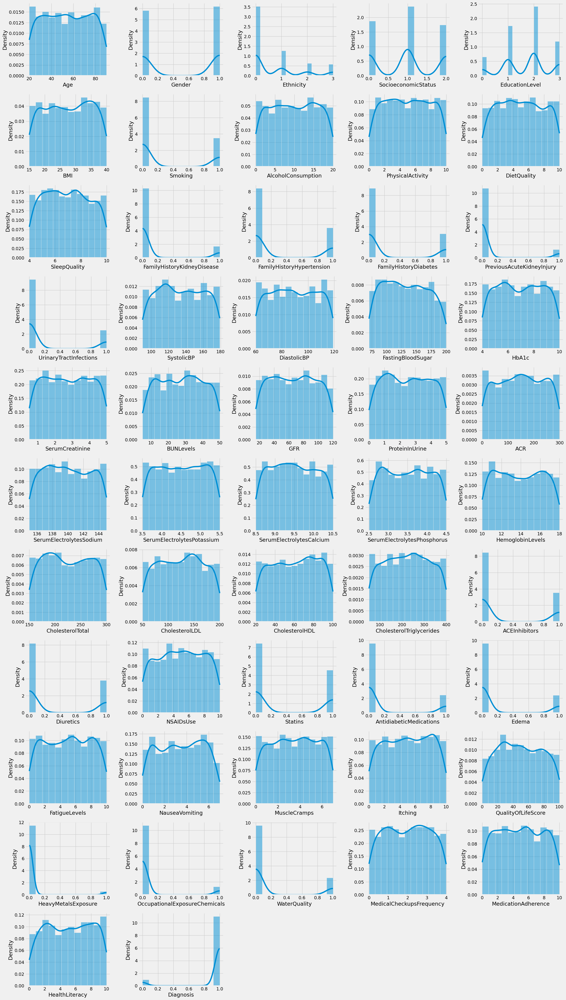

In [11]:
# Visualize numerical features distribution:

# Determine number of plots and subplot grid:
num_plots = len(df.columns)
cols = 5
rows = math.ceil(num_plots / cols)

cell_width = 5  # inches per subplot column
cell_height = 4  # inches per subplot row

# Scale figure size with number of rows
plt.figure(figsize=(cols * cell_width, rows * cell_height))

for i, column in enumerate(df.columns, 1):
    ax = plt.subplot(rows, cols, i)
    # Try to use histplot instead of deprecated distplot:
    # sns.histplot(df[column], kde=True, ax=ax)
    # sns.distplot(df[column])
    sns.histplot(df[column], kde=True, stat="density", element="bars", ax=ax)
    # Optional styling:
    # sns.rugplot(df[column], ax=ax, color="black", height=0.05)
    ax.set_xlabel(column)

plt.tight_layout()
plt.show()

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659 entries, 0 to 1658
Data columns (total 52 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            1659 non-null   int64  
 1   Gender                         1659 non-null   int64  
 2   Ethnicity                      1659 non-null   int64  
 3   SocioeconomicStatus            1659 non-null   int64  
 4   EducationLevel                 1659 non-null   int64  
 5   BMI                            1659 non-null   float64
 6   Smoking                        1659 non-null   int64  
 7   AlcoholConsumption             1659 non-null   float64
 8   PhysicalActivity               1659 non-null   float64
 9   DietQuality                    1659 non-null   float64
 10  SleepQuality                   1659 non-null   float64
 11  FamilyHistoryKidneyDisease     1659 non-null   int64  
 12  FamilyHistoryHypertension      1659 non-null   i

In [13]:
# Visualize categorical column data distribution:

### Note - would need to transform categorical columns from numeric columns...

'''
num_plots = len(cat_cols)
cols = 3
rows = math.ceil(num_plots / cols)

cell_width = 5  # inches per subplot column
cell_height = 4  # inches per subplot row

plt.figure(figsize=(cols * cell_width, rows * cell_height))

for i, column in enumerate(cat_cols, 1):
    ax = plt.subplot(rows, cols, i)
    sns.countplot(data=df, x=column, hue=column, palette='rocket', legend=False, ax=ax)
    ax.set_xlabel(column)

plt.tight_layout()
plt.show()
'''

"\nnum_plots = len(cat_cols)\ncols = 3\nrows = math.ceil(num_plots / cols)\n\ncell_width = 5  # inches per subplot column\ncell_height = 4  # inches per subplot row\n\nplt.figure(figsize=(cols * cell_width, rows * cell_height))\n\nfor i, column in enumerate(cat_cols, 1):\n    ax = plt.subplot(rows, cols, i)\n    sns.countplot(data=df, x=column, hue=column, palette='rocket', legend=False, ax=ax)\n    ax.set_xlabel(column)\n\nplt.tight_layout()\nplt.show()\n"

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659 entries, 0 to 1658
Data columns (total 52 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            1659 non-null   int64  
 1   Gender                         1659 non-null   int64  
 2   Ethnicity                      1659 non-null   int64  
 3   SocioeconomicStatus            1659 non-null   int64  
 4   EducationLevel                 1659 non-null   int64  
 5   BMI                            1659 non-null   float64
 6   Smoking                        1659 non-null   int64  
 7   AlcoholConsumption             1659 non-null   float64
 8   PhysicalActivity               1659 non-null   float64
 9   DietQuality                    1659 non-null   float64
 10  SleepQuality                   1659 non-null   float64
 11  FamilyHistoryKidneyDisease     1659 non-null   int64  
 12  FamilyHistoryHypertension      1659 non-null   i

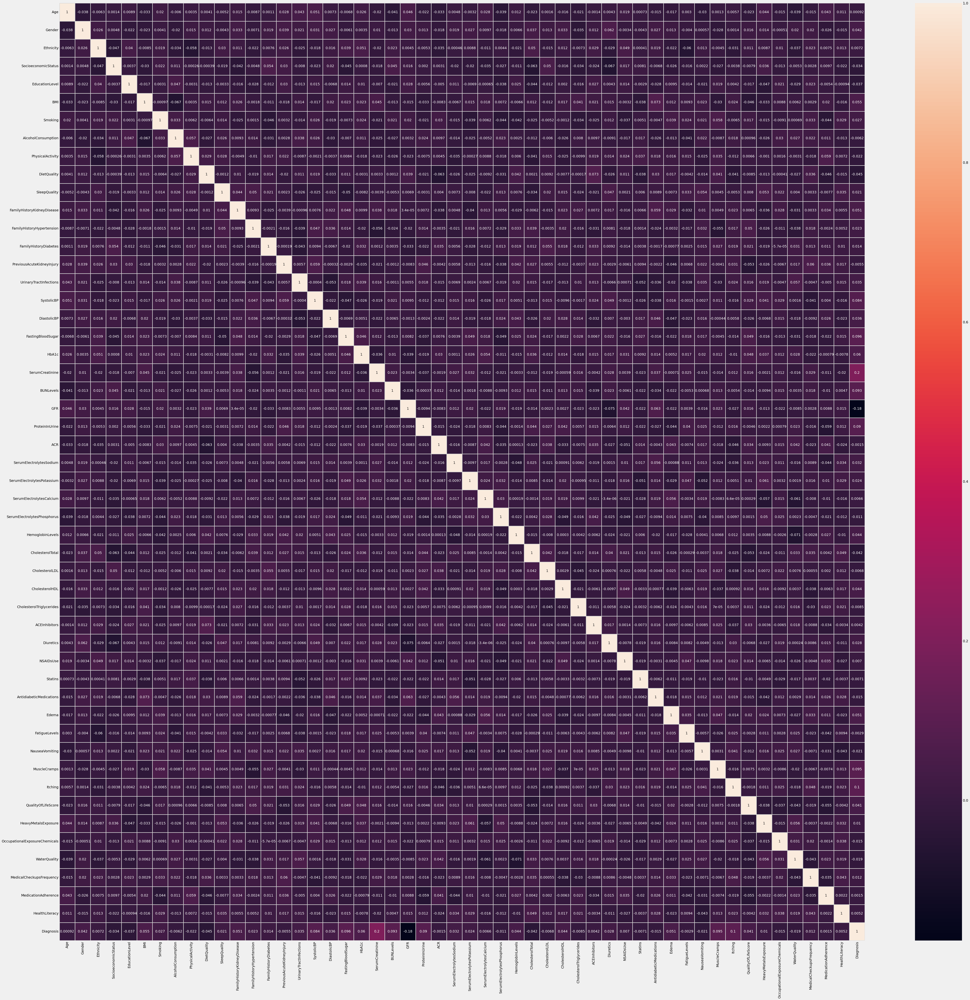

In [15]:
# Heatmap of data:

cell_size = 1.25  # in inches — adjust to make text readable
columns = df.shape[1]
rows = columns  # square correlation matrix

width = cell_size * columns
height = cell_size * rows

plt.figure(figsize=(width, height))
sns.heatmap(df.corr(numeric_only=True), annot=True, linewidths=2, linecolor='lightgrey')

plt.show()

In [16]:
# Show data columns:
df.columns

Index(['Age', 'Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel',
       'BMI', 'Smoking', 'AlcoholConsumption', 'PhysicalActivity',
       'DietQuality', 'SleepQuality', 'FamilyHistoryKidneyDisease',
       'FamilyHistoryHypertension', 'FamilyHistoryDiabetes',
       'PreviousAcuteKidneyInjury', 'UrinaryTractInfections', 'SystolicBP',
       'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine',
       'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium',
       'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium',
       'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal',
       'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides',
       'ACEInhibitors', 'Diuretics', 'NSAIDsUse', 'Statins',
       'AntidiabeticMedications', 'Edema', 'FatigueLevels', 'NauseaVomiting',
       'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'HeavyMetalsExposure',
       'OccupationalExposureChemicals', 'WaterQuality',
       'Medi

### Visual Data Analysis:

In [17]:
# Functions to plot data:

# Create a violin plot to contrast each column for those with and without CKD
# Include a box plot within the violin plot (box=True)
def violin(col):
    fig = px.violin(df, y=col, x='class', color='class', box=True, template='plotly_dark',
                    color_discrete_map={0: '#636EFA', 1: '#EF553B'})
    fig.update_layout(legend_traceorder='reversed')
    return fig.show()

# Create a Kernel Density Estimation plot contrasting those with and without CKD
# Allows visualizing the probability density function (PDF) of a continuous variable
# In other words - this visually shows the distribution of the column data
def kde(col):
    grid = sns.FacetGrid(df, hue='class', height=6, aspect=2)
    # grid.map(sns.kdeplot, col, warn_singular=False)
    grid.map(sns.kdeplot, col)
    grid.add_legend()

# Create a scatter plot contrasting pairs of columns for those with and without CKD
# This allows visualizing the relationship and correlation between pairs of columns
# while simultaneously differentiating (via color) those with and without CKD
def scatter(col1, col2):
    fig = px.scatter(df, x=col1, y=col2, color='class', template='plotly_dark',
                     color_discrete_map={0: '#636EFA', 1: '#EF553B'})
    fig.update_layout(legend_traceorder='reversed')
    return fig.show()

In [18]:
# Need to pick appropriate columns for graphs:

# violin('red_blood_cell_count')

In [19]:
# kde('red_blood_cell_count')

In [20]:
# violin('white_blood_cell_count')

In [21]:
# kde('white_blood_cell_count')

In [22]:
# violin('packed_cell_volume')

In [23]:
# kde('packed_cell_volume')

In [24]:
# violin('hemoglobin')

In [25]:
# kde('hemoglobin')

In [26]:
# violin('albumin')

In [27]:
# kde('albumin')

In [28]:
# violin('blood_glucose_random')

In [29]:
# kde('blood_glucose_random')

In [30]:
# violin('sodium')

In [31]:
# kde('sodium')

In [32]:
# violin('blood_urea')

In [33]:
# kde('blood_urea')

In [34]:
# violin('specific_gravity')

In [35]:
# kde('specific_gravity')

In [36]:
# scatter('hemoglobin', 'packed_cell_volume')

In [37]:
# scatter('red_blood_cell_count', 'packed_cell_volume')

In [38]:
# scatter('red_blood_cell_count', 'albumin')

In [39]:
# scatter('sugar', 'blood_glucose_random')

In [40]:
# scatter('packed_cell_volume','blood_urea')

In [41]:
# px.bar(df, x="specific_gravity", y="packed_cell_volume", color='class', barmode='group', template = 'plotly_dark', height = 400)

In [42]:
# px.bar(df, x="specific_gravity", y="albumin", color='class', barmode='group', template = 'plotly_dark', height = 400)

In [43]:
# px.bar(df, x="blood_pressure", y="packed_cell_volume", color='class', barmode='group', template = 'plotly_dark', height = 400)

In [44]:
# px.bar(df, x="blood_pressure", y="hemoglobin", color='class', barmode='group', template = 'plotly_dark', height = 400)

### Data Cleaning:

In [45]:
# Check for null values:
df.isna().sum().sort_values(ascending = False)

Age                              0
Gender                           0
SerumElectrolytesPhosphorus      0
HemoglobinLevels                 0
CholesterolTotal                 0
CholesterolLDL                   0
CholesterolHDL                   0
CholesterolTriglycerides         0
ACEInhibitors                    0
Diuretics                        0
NSAIDsUse                        0
Statins                          0
AntidiabeticMedications          0
Edema                            0
FatigueLevels                    0
NauseaVomiting                   0
MuscleCramps                     0
Itching                          0
QualityOfLifeScore               0
HeavyMetalsExposure              0
OccupationalExposureChemicals    0
WaterQuality                     0
MedicalCheckupsFrequency         0
MedicationAdherence              0
HealthLiteracy                   0
SerumElectrolytesCalcium         0
SerumElectrolytesPotassium       0
SerumElectrolytesSodium          0
FamilyHistoryHyperte

### Feature Encoding:

In [46]:
# display_cols(cat_cols, val_title='Categories', op='nunique')

### Label Encoding:

In [47]:
'''
le = LabelEncoder()

for col in cat_cols:
    df[col] = le.fit_transform(df[col])
'''

'\nle = LabelEncoder()\n\nfor col in cat_cols:\n    df[col] = le.fit_transform(df[col])\n'

In [48]:
# df.head()

<a id = '5.0'></a>
<p style = "font-size : 45px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Model Building</strong></p> 

In [49]:
ckd_col = 'Diagnosis'

ind_col = [col for col in df.columns if col != ckd_col]
dep_col = ckd_col

X = df[ind_col]
y = df[dep_col]

In [50]:
# Split data into training and test sets:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [51]:
# Build confusion matrix results dataframe:
def get_cm_results(cm):
    # cm is the result of sklearn.metrics.confusion_matrix(y_test, classifier.predict(X_test))
    tn, fp, fn, tp = cm.ravel()
    data = [
        {'Result': 'True Positive', 'Number': tp,
         'Description': 'Actual occurrence, correctly predicted'},
        {'Result': 'True Negative', 'Number': tn,
         'Description': 'Non-occurrence, correctly predicted'},
        {'Result': 'False Negative', 'Number': fn,
         'Description': 'Actual occurrence, incorrectly predicted (Type II error)'},
        {'Result': 'False Positive', 'Number': fp,
         'Description': 'Non-occurrence, incorrectly predicted (Type I error)'},
    ]
    return pd.DataFrame(data).style.set_properties(
        subset=['Description'], **{'text-align': 'left'}
    ).hide(axis='index')


# Build confusion matrix metrics dataframe:
def get_cm_metrics(cm):
    # cm is the result of sklearn.metrics.confusion_matrix(y_test, classifier.predict(X_test))
    tn, fp, fn, tp = cm.ravel()
    prec_val = tp/(tp + fp)
    rec_val = tp/(tp + fn)
    data = [
        {'Metric': 'Accuracy', 'Value': (tp + tn)/(tp + tn + fp + fn),
         'Description': 'How often is classifier correct'},
        {'Metric': 'Precision', 'Value': prec_val,
         'Description': 'How often is TP correctly predicted (% of correct positives)'},
        {'Metric': 'Recall', 'Value': rec_val,
         'Description': 'How often is actual occurrence correctly predicted'},
        {'Metric': 'F1-Score', 'Value': (2 * prec_val * rec_val)/(prec_val + rec_val),
         'Description': 'Account for both precision and recall using harmonic mean'},
        {'Metric': 'Misclassification', 'Value': (fp + fn)/(tp + tn + fp + fn),
         'Description': 'How often is classifier wrong'},
        {'Metric': 'NPV', 'Value': tn/(tn + fn),
         'Description': 'How often is TN correctly predicted (% of correct negatives)'},
        {'Metric': 'FPR', 'Value': fp/(tn + fp),
         'Description': 'How often is non-occurrence falsely predicted'},
        {'Metric': 'Specificity', 'Value': tn/(tn + fp),
         'Description': 'How often is actual non-occurrence correctly predicted'},
        {'Metric': 'Prevalence', 'Value': (fn + tp)/(tp + tn + fp + fn),
         'Description': 'How often does actually occur in sample'},
    ]
    return pd.DataFrame(data).style.set_properties(
        subset=['Description'], **{'text-align': 'left'}
    ).format({'Value': '{:.2%}'}).hide(axis='index')

# Plot confusion matrix heatmap:
def cm_heatmap(cm):
    classes = ['No CKD', 'CKD']
    df_cm = pd.DataFrame(cm, index=classes, columns=classes)
    
    # Flip horizontally and vertically
    df_cm = df_cm.iloc[::-1, ::-1]
    
    plt.figure(figsize=(5,4))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='coolwarm_r',
                linewidths=0.5, cbar_kws={'label': 'Count'})
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix Heatmap')
    return plt.show()

<a id = '5.2'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Decision Tree Classifier</strong></p> 

In [52]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

# Accuracy score, confusion matrix and classification report of decision tree:
dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(f"Training Accuracy of Decision Tree Classifier is {accuracy_score(y_train, dtc.predict(X_train))}")
print(f"Test Accuracy of Decision Tree Classifier is {dtc_acc} \n")

cm = confusion_matrix(y_test, dtc.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, dtc.predict(X_test))}")

Training Accuracy of Decision Tree Classifier is 1.0
Test Accuracy of Decision Tree Classifier is 0.8855421686746988 

Confusion Matrix :- 
[[ 15  31]
 [ 26 426]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.37      0.33      0.34        46
           1       0.93      0.94      0.94       452

    accuracy                           0.89       498
   macro avg       0.65      0.63      0.64       498
weighted avg       0.88      0.89      0.88       498



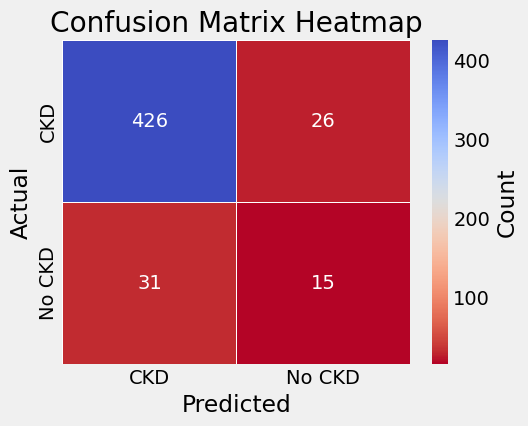

Result,Number,Description
True Positive,426,"Actual occurrence, correctly predicted"
True Negative,15,"Non-occurrence, correctly predicted"
False Negative,26,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,31,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,88.55%,How often is classifier correct
Precision,93.22%,How often is TP correctly predicted (% of correct positives)
Recall,94.25%,How often is actual occurrence correctly predicted
F1-Score,93.73%,Account for both precision and recall using harmonic mean
Misclassification,11.45%,How often is classifier wrong
NPV,36.59%,How often is TN correctly predicted (% of correct negatives)
FPR,67.39%,How often is non-occurrence falsely predicted
Specificity,32.61%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [53]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

In [54]:
# Hyper parameter tuning of decision tree:

# Input hyper paramter to choose from to find the best estimator to increase the accuracy and avoid overfitting of the model:
grid_param = {
    'criterion' : ['gini', 'entropy'],
    'max_depth' : [3, 5, 7, 10],
    'splitter' : ['best', 'random'],
    'min_samples_leaf' : [1, 2, 3, 5, 7],
    'min_samples_split' : [1, 2, 3, 5, 7],
    'max_features' : ['auto', 'sqrt', 'log2']  # How many input features the tree considers to build the model.
}

# Use GridSearchCV to try provided different compbination of hyper parameter:
grid_search_dtc = GridSearchCV(dtc, grid_param, cv = 5, n_jobs = -1, verbose = 1)
grid_search_dtc.fit(X_train, y_train)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits


C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
2800 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
994 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\base.py", line 436, in _va

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 3, 5, 7],
                         'min_samples_split': [1, 2, 3, 5, 7],
                         'splitter': ['best', 'random']},
             verbose=1)

In [55]:
# Best parameters and best score:
print(grid_search_dtc.best_params_)
print(grid_search_dtc.best_score_)

{'criterion': 'gini', 'max_depth': 3, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'}
0.9267907355335208


In [56]:
# Best estimator:
dtc = grid_search_dtc.best_estimator_

# Accuracy score, confusion matrix and classification report of decision tree
dtc_acc = accuracy_score(y_test, dtc.predict(X_test))

print(f"Training Accuracy of Decision Tree Classifier - Hyperparameter best estimator is {accuracy_score(y_train, dtc.predict(X_train))}")
print(f"Test Accuracy of Decision Tree Classifier - Hyperparameter best estimator is {dtc_acc} \n")

cm = confusion_matrix(y_test, dtc.predict(X_test))
print(f"Confusion Matrix after hyperparameter tuning :- \n{cm}\n")
print(f"Classification Report after hyperparameter tuning :- \n {classification_report(y_test, dtc.predict(X_test))}")

Training Accuracy of Decision Tree Classifier - Hyperparameter best estimator is 0.9233419465977606
Test Accuracy of Decision Tree Classifier - Hyperparameter best estimator is 0.9076305220883534 

Confusion Matrix after hyperparameter tuning :- 
[[  0  46]
 [  0 452]]

Classification Report after hyperparameter tuning :- 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        46
           1       0.91      1.00      0.95       452

    accuracy                           0.91       498
   macro avg       0.45      0.50      0.48       498
weighted avg       0.82      0.91      0.86       498



C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

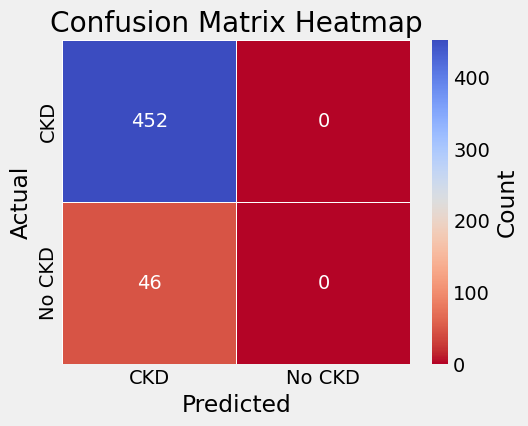

Result,Number,Description
True Positive,452,"Actual occurrence, correctly predicted"
True Negative,0,"Non-occurrence, correctly predicted"
False Negative,0,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,46,"Non-occurrence, incorrectly predicted (Type I error)"


C:\Users\james\AppData\Local\Temp\ipykernel_57612\2474129495.py:37: RuntimeWarning: invalid value encountered in scalar divide
  {'Metric': 'NPV', 'Value': tn/(tn + fn),


Metric,Value,Description
Accuracy,90.76%,How often is classifier correct
Precision,90.76%,How often is TP correctly predicted (% of correct positives)
Recall,100.00%,How often is actual occurrence correctly predicted
F1-Score,95.16%,Account for both precision and recall using harmonic mean
Misclassification,9.24%,How often is classifier wrong
NPV,nan%,How often is TN correctly predicted (% of correct negatives)
FPR,100.00%,How often is non-occurrence falsely predicted
Specificity,0.00%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [57]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Random Forest Classifier</strong></p>

In [58]:
# Note:  The default for max_features changed from 'auto' to 'sqrt', updating:
# Direct initialization of RandomForestClassifier object for specific hyperparamter value.
# Not using RandomizedSearchCV for the tunning.
rd_clf = RandomForestClassifier(
    criterion = 'entropy', max_depth = 11, max_features = 'sqrt',
    min_samples_leaf = 2, min_samples_split = 3, n_estimators = 130
)
rd_clf.fit(X_train, y_train)

# Accuracy score, confusion matrix and classification report of random forest:
rd_clf_acc = accuracy_score(y_test, rd_clf.predict(X_test))

print(f"Training Accuracy of Random Forest Classifier is {accuracy_score(y_train, rd_clf.predict(X_train))}")
print(f"Test Accuracy of Random Forest Classifier is {rd_clf_acc} \n")

cm = confusion_matrix(y_test, rd_clf.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, rd_clf.predict(X_test))}")

Training Accuracy of Random Forest Classifier is 0.9870801033591732
Test Accuracy of Random Forest Classifier is 0.9076305220883534 

Confusion Matrix :- 
[[  0  46]
 [  0 452]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        46
           1       0.91      1.00      0.95       452

    accuracy                           0.91       498
   macro avg       0.45      0.50      0.48       498
weighted avg       0.82      0.91      0.86       498



C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Working\GitHub\sockduct\HealthPredictor\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

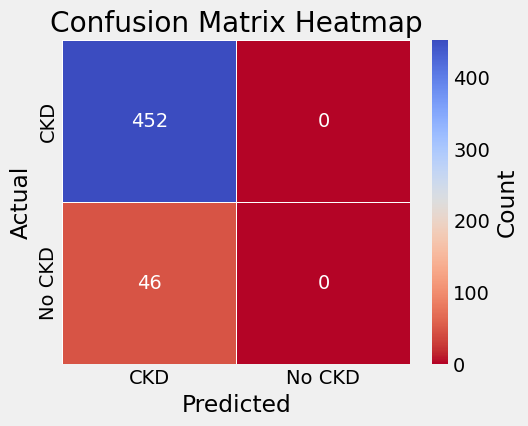

Result,Number,Description
True Positive,452,"Actual occurrence, correctly predicted"
True Negative,0,"Non-occurrence, correctly predicted"
False Negative,0,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,46,"Non-occurrence, incorrectly predicted (Type I error)"


C:\Users\james\AppData\Local\Temp\ipykernel_57612\2474129495.py:37: RuntimeWarning: invalid value encountered in scalar divide
  {'Metric': 'NPV', 'Value': tn/(tn + fn),


Metric,Value,Description
Accuracy,90.76%,How often is classifier correct
Precision,90.76%,How often is TP correctly predicted (% of correct positives)
Recall,100.00%,How often is actual occurrence correctly predicted
F1-Score,95.16%,Account for both precision and recall using harmonic mean
Misclassification,9.24%,How often is classifier wrong
NPV,nan%,How often is TN correctly predicted (% of correct negatives)
FPR,100.00%,How often is non-occurrence falsely predicted
Specificity,0.00%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [59]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>XgBoost</strong></p>

In [60]:
# Use of the XGBoost (Extreme Gradient Boosting) algorithm for a binary classification task
xgb = XGBClassifier(objective = 'binary:logistic', learning_rate = 0.5, max_depth = 5, n_estimators = 150)
xgb.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of xgboost
xgb_acc = accuracy_score(y_test, xgb.predict(X_test))

print(f"Training Accuracy of XgBoost is {accuracy_score(y_train, xgb.predict(X_train))}")
print(f"Test Accuracy of XgBoost is {xgb_acc} \n")

cm = confusion_matrix(y_test, xgb.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, xgb.predict(X_test))}")

Training Accuracy of XgBoost is 1.0
Test Accuracy of XgBoost is 0.9236947791164659 

Confusion Matrix :- 
[[ 13  33]
 [  5 447]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.72      0.28      0.41        46
           1       0.93      0.99      0.96       452

    accuracy                           0.92       498
   macro avg       0.83      0.64      0.68       498
weighted avg       0.91      0.92      0.91       498



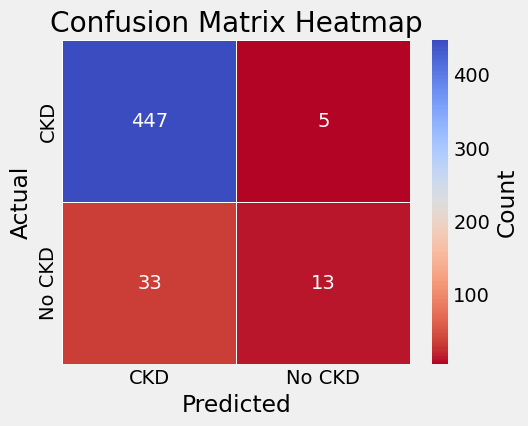

Result,Number,Description
True Positive,447,"Actual occurrence, correctly predicted"
True Negative,13,"Non-occurrence, correctly predicted"
False Negative,5,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,33,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,92.37%,How often is classifier correct
Precision,93.12%,How often is TP correctly predicted (% of correct positives)
Recall,98.89%,How often is actual occurrence correctly predicted
F1-Score,95.92%,Account for both precision and recall using harmonic mean
Misclassification,7.63%,How often is classifier wrong
NPV,72.22%,How often is TN correctly predicted (% of correct negatives)
FPR,71.74%,How often is non-occurrence falsely predicted
Specificity,28.26%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [61]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

<a id = '5.3'></a>
<p style = "font-size : 25px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #fbc6a4; border-radius: 5px 5px;"><strong>Logistic Regression</strong></p>

In [62]:
# Use of the Logistic Regression algorithm for a binary classification task
# liblinear is good for smaller datasets. For larger datasets, solvers like 'lbfgs' or 'saga' may perform better.  This parameter sets the seed for the random number generator used by the model. Setting a random_state ensures that the results are reproducible. If you run the code multiple times with the same random_state, you'll get the same results.
logistic_regression = LogisticRegression(solver='liblinear', random_state=42) 

logistic_regression.fit(X_train, y_train)

# accuracy score, confusion matrix and classification report of logistic regression
logistic_acc = accuracy_score(y_test, logistic_regression.predict(X_test))

print(f"Training Accuracy of Logistic Regression is {accuracy_score(y_train, logistic_regression.predict(X_train))}")
print(f"Test Accuracy of Logistic Regression is {logistic_acc} \n")

cm = confusion_matrix(y_test, logistic_regression.predict(X_test))
print(f"Confusion Matrix :- \n{cm}\n")
print(f"Classification Report :- \n {classification_report(y_test, logistic_regression.predict(X_test))}")

Training Accuracy of Logistic Regression is 0.9414298018949182
Test Accuracy of Logistic Regression is 0.9156626506024096 

Confusion Matrix :- 
[[  6  40]
 [  2 450]]

Classification Report :- 
               precision    recall  f1-score   support

           0       0.75      0.13      0.22        46
           1       0.92      1.00      0.96       452

    accuracy                           0.92       498
   macro avg       0.83      0.56      0.59       498
weighted avg       0.90      0.92      0.89       498



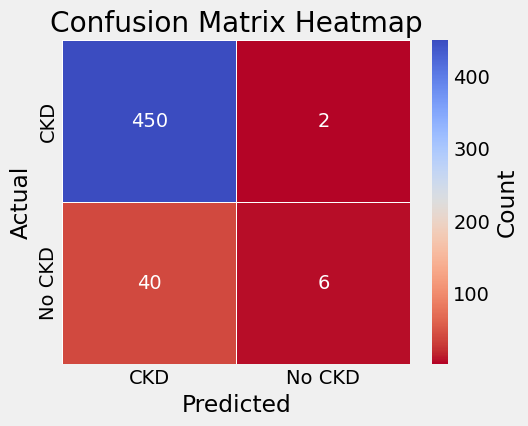

Result,Number,Description
True Positive,450,"Actual occurrence, correctly predicted"
True Negative,6,"Non-occurrence, correctly predicted"
False Negative,2,"Actual occurrence, incorrectly predicted (Type II error)"
False Positive,40,"Non-occurrence, incorrectly predicted (Type I error)"


Metric,Value,Description
Accuracy,91.57%,How often is classifier correct
Precision,91.84%,How often is TP correctly predicted (% of correct positives)
Recall,99.56%,How often is actual occurrence correctly predicted
F1-Score,95.54%,Account for both precision and recall using harmonic mean
Misclassification,8.43%,How often is classifier wrong
NPV,75.00%,How often is TN correctly predicted (% of correct negatives)
FPR,86.96%,How often is non-occurrence falsely predicted
Specificity,13.04%,How often is actual non-occurrence correctly predicted
Prevalence,90.76%,How often does actually occur in sample


In [63]:
# Plot confusion matrix heatmap:
cm_heatmap(cm)

# Show classifier results and metrics:
display(get_cm_results(cm))
display(get_cm_metrics(cm))

<a id = '6.0'></a>
<p style = "font-size : 35px; color : #34656d ; font-family : 'Comic Sans MS'; text-align : center; background-color : #f9b208; border-radius: 5px 5px;"><strong>Models Comparison</strong></p> 

In [64]:
models = pd.DataFrame({
    'Model' : ['Decision Tree Classifier', 'Random Forest Classifier', 'XgBoost', 'Logistic Regression'],
    'Score' : [dtc_acc, rd_clf_acc, xgb_acc, logistic_acc]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
2,XgBoost,0.923695
3,Logistic Regression,0.915663
0,Decision Tree Classifier,0.907631
1,Random Forest Classifier,0.907631


In [65]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark', 
       title = 'Models Comparison')

### Select random forest classifier - more reliable:

C:\Users\james\AppData\Local\Temp\ipykernel_57612\933044396.py:10: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



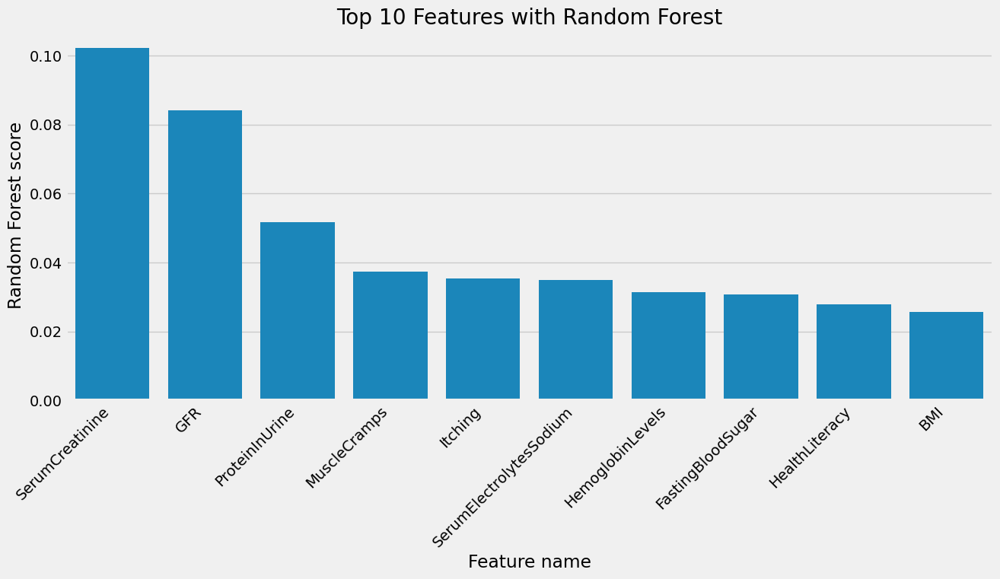

In [66]:
# Top 10 Features:
feature_scores=pd.DataFrame(rd_clf.feature_importances_,columns=['Score'],index=X_train.columns).sort_values(by='Score',ascending=False)
top10_feature = feature_scores.nlargest(n=10, columns=['Score'])

plt.figure(figsize=(14,6))
g = sns.barplot(x=top10_feature.index, y=top10_feature['Score'])
p = plt.title('Top 10 Features with Random Forest')
p = plt.xlabel('Feature name')
p = plt.ylabel('Random Forest score')
p = g.set_xticklabels(g.get_xticklabels(), horizontalalignment='right', rotation=45)

In [67]:
top10_feature.index

Index(['SerumCreatinine', 'GFR', 'ProteinInUrine', 'MuscleCramps', 'Itching',
       'SerumElectrolytesSodium', 'HemoglobinLevels', 'FastingBloodSugar',
       'HealthLiteracy', 'BMI'],
      dtype='object')

In [68]:
X.columns

Index(['Age', 'Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel',
       'BMI', 'Smoking', 'AlcoholConsumption', 'PhysicalActivity',
       'DietQuality', 'SleepQuality', 'FamilyHistoryKidneyDisease',
       'FamilyHistoryHypertension', 'FamilyHistoryDiabetes',
       'PreviousAcuteKidneyInjury', 'UrinaryTractInfections', 'SystolicBP',
       'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine',
       'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium',
       'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium',
       'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal',
       'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides',
       'ACEInhibitors', 'Diuretics', 'NSAIDsUse', 'Statins',
       'AntidiabeticMedications', 'Edema', 'FatigueLevels', 'NauseaVomiting',
       'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'HeavyMetalsExposure',
       'OccupationalExposureChemicals', 'WaterQuality',
       'Medi

In [69]:
# Prune columns not in top 10:
for ele in X.columns:
    if ele not in top10_feature.index:
        X = X.drop(ele, axis = 1)

In [70]:
X.head()

,BMI,FastingBloodSugar,SerumCreatinine,GFR,ProteinInUrine,SerumElectrolytesSodium,HemoglobinLevels,MuscleCramps,Itching,HealthLiteracy
0,31.069414,72.510788,4.962531,45.703204,0.744980,137.652501,16.114679,4.518513,7.556302,9.871449
1,29.692119,100.848875,3.156799,55.784504,3.052317,138.141335,15.349205,2.202222,6.836766,7.161765
2,37.394822,160.989441,3.698236,67.559032,1.157839,142.970116,13.018834,5.967271,2.144722,7.354632
3,31.329680,188.506620,2.868468,33.202542,3.745871,137.106913,15.056339,2.176387,7.077188,6.629587
4,23.726311,82.156699,3.964877,56.319082,2.570993,140.627812,16.690561,6.800993,3.553118,1.437385


In [71]:
X_train=X_train[X.columns]
X_test=X_test[X.columns]
rd_clf.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=11, min_samples_leaf=2,
                       min_samples_split=3, n_estimators=130)

### Testing Predictions:

In [72]:
# Prediction 1 - no CKD:

# Need to re-do for this dataset...

'''
prediction = rd_clf.predict([[1.025, 15.8, 1.1, 0.0, 53.0, 0, 0, 131.0, 6.1, 18.0]])[0]
if prediction:
    print('Oops! You have Chronic Kidney Disease.')
else:
    print("Great! You don't have Chronic Kidney Disease.")
'''

'\nprediction = rd_clf.predict([[1.025, 15.8, 1.1, 0.0, 53.0, 0, 0, 131.0, 6.1, 18.0]])[0]\nif prediction:\n    print(\'Oops! You have Chronic Kidney Disease.\')\nelse:\n    print("Great! You don\'t have Chronic Kidney Disease.")\n'

In [73]:
# Prediction 2 - CKD:

# Need to re-do for this dataset...

'''
prediction = rd_clf.predict([[1.020, 15.4, 1.2, 1.0, 44.0, 1, 1, 121.0, 5.2, 36.0]])[0]
if prediction:
    print('Oops! You have Chronic Kidney Disease.')
else:
    print("Great! You don't have Chronic Kidney Disease.")
'''

'\nprediction = rd_clf.predict([[1.020, 15.4, 1.2, 1.0, 44.0, 1, 1, 121.0, 5.2, 36.0]])[0]\nif prediction:\n    print(\'Oops! You have Chronic Kidney Disease.\')\nelse:\n    print("Great! You don\'t have Chronic Kidney Disease.")\n'

### Serialize and save model:

In [74]:
pickle.dump(rd_clf,open('CKD-Kaggle.pkl', 'wb'))